# Competition description

 - Official page: [https://self-driving.lyft.com/level5/prediction/](https://self-driving.lyft.com/level5/prediction/)

<blockquote>
    The dataset consists of 170,000 scenes capturing the environment around the autonomous vehicle. Each scene encodes the state of the vehicle’s surroundings at a given point in time.
</blockquote>

<br/>
<p><b>The goal of this competition is to predict other car/cyclist/pedestrian (called "agent")'s motion.</b><p>
  
<p><a href="https://vimeo.com/389096888">Lyft Self-Driving Employee Rides Testing</a> from <a href="https://vimeo.com/user99616812">Lyft Level 5</a> on <a href="https://vimeo.com">Vimeo</a>.</p>

# Environment setup

Following instruction will work only on kaggle kernel.<br/>
Please try following this step by creating new kernel (or forking this kernel) on kaggle.

## Install the additional library: l5kit
We want to install `l5kit` library, which is provided by Lyft to handle this competition's dataset (Level5 Prediction Dataset).<br/>
Here I use the "Utility script" functionality of kaggle kernel, instead of installing the library by `pip install` command.


Click "File" botton on top-left, and choose "Add utility script". For the pop-up search window, you need to remove "Your Work" filter, and search "[philculliton/kaggle-l5kit](https://www.kaggle.com/mathurinache/kaggle-l5kit)" on top-right of the search window.
Then you can add the **kaggle-l5kit** utility script.

If successful, you can see "usr/lib/kaggle-l5kit" is added to the "Data" section of this kernel page on right side of the kernel.

Reference for utility script
 - [Feature Launch: Import scripts into notebook kernels](https://www.kaggle.com/product-feedback/91185)
 - [Import functions from Kaggle script](https://www.kaggle.com/rtatman/import-functions-from-kaggle-script)

In [1]:
# Running this pip install code takes time, we can skip it when we attach utility script correctly!
# !pip install -U l5kit

import l5kit
l5kit.__version__

'1.1.0'

As we can see, we don't need to hassle with the time to run `pip install` which takes time to install the library. Just attach the utility script and the library is already setup!

## Attach additional dataset source: for config files

We are using some config files when we want to load/visualize Lyft level5 dataset.<br/>
@jpbremer already uploaded config files as Kaggle Dataset platform: [lyft-config-files](https://www.kaggle.com/jpbremer/lyft-config-files).<br/>
This is originally from official github [lyft/l5kit example page](https://github.com/lyft/l5kit/tree/master/examples).

Click "Add data" button and press "Search by URL". Typing "https://www.kaggle.com/jpbremer/lyft-config-files" shows the dataset.<br/>
Once the dataset is successfully added you can see "lyft-config-files" as dataset on left side bar.

## import

In [2]:
import gc
import os
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML

# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

In [3]:
from l5kit.data import ChunkedDataset, LocalDataManager
from l5kit.dataset import EgoDataset, AgentDataset

from l5kit.rasterization import build_rasterizer
from l5kit.configs import load_config_data
from l5kit.visualization import draw_trajectory, TARGET_POINTS_COLOR
from l5kit.geometry import transform_points
from tqdm import tqdm
from collections import Counter
from l5kit.data import PERCEPTION_LABELS
from prettytable import PrettyTable

import os

from matplotlib import animation, rc
from IPython.display import HTML

rc('animation', html='jshtml')

In [4]:
# Input data files are available in the "../input/" directory.
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     filenames.sort()
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# Basic tutorial

Before going to look the data, we still need to learn some advanced functionality to handle data.

This section basically follows [Data format](https://github.com/lyft/l5kit/blob/master/data_format.md) description page of l5kit.

## numpy structured array

Lyft dataset uses numpy's [structured array](https://docs.scipy.org/doc/numpy/user/basics.rec.html) functionality to store various kinds of features together.<br/>
Let's see example to how it works

In [5]:
my_arr = np.zeros(3, dtype=[("color", (np.uint8, 3)), ("label", np.bool)])

my_arr[0]["color"] = [0, 218, 130]
my_arr[0]["label"] = True
my_arr[1]["color"] = [245, 59, 255]
my_arr[1]["label"] = True

my_arr

array([([  0, 218, 130],  True), ([245,  59, 255],  True),
       ([  0,   0,   0], False)],
      dtype=[('color', 'u1', (3,)), ('label', '?')])

At top line we defined length=3 array. Usually each element of array consists of only integer or float, but we can define custom structured format by specifying `dtype` as list of "fields" which consists of name and structure.

Above example contains 2 fields. 1. 8byte uint with length 3 array, 2. single element boolean array.

As you can see, `my_arr[i]["name"]` will access i-th element's "name" field.

Usually when we train neural network, we would like to access all the field of random i-th element.
According to [Lyft Data Format page](https://github.com/lyft/l5kit/blob/master/data_format.md), "Structured arrays are a great fit to group this data together in memory and on disk.", rather than preparing "color" array and "label" array separately and access each array's i-th element, especially when the number of field glow. 

## zarr

Zarr data format is used to store and read these numpy structured arrays from disk.<br/>
Zarr allows us to write very large (structured) arrays to disk in n-dimensional compressed chunks.

Here is a short tutorial:

In [6]:
import zarr

z = zarr.open("./dataset.zarr", mode="w", shape=(500,), dtype=np.float32, chunks=(100,))

# We can write to it by assigning to it. This gets persisted on disk.
z[0:150] = np.arange(150)

As we specified chunks to be of size 100, we just wrote to two separate chunks. On your filesystem in the dataset.zarr folder you will now find these two chunks. As we didn't completely fill the second chunk, those missing values will be set to the fill value (defaults to 0). The chunks are actually compressed on disk too! 

We can print some info: by not doing much work at all we saved almost 75% in disk space!

In [7]:
print(z.info)

Type               : zarr.core.Array
Data type          : float32
Shape              : (500,)
Chunk shape        : (100,)
Order              : C
Read-only          : False
Compressor         : Blosc(cname='lz4', clevel=5, shuffle=SHUFFLE, blocksize=0)
Store type         : zarr.storage.DirectoryStore
No. bytes          : 2000 (2.0K)
No. bytes stored   : 577
Storage ratio      : 3.5
Chunks initialized : 2/5



When we check filesystem, `dataset.zarr` directory is created and there are 2 files "0" and "1" which are chunks currently created by just assigning value to zarr array.

In [8]:
!ls -l ./*

---------- 1 root root  263 Jun 25 12:25 ./__notebook_source__.ipynb

./dataset.zarr:
total 8
-rw-r--r-- 1 root root 157 Jun 25 12:42 0
-rw-r--r-- 1 root root 105 Jun 25 12:42 1


Reading from a zarr array is as easy as slicing from it like you would any numpy array. The return value is an ordinary numpy array. Zarr takes care of determining which chunks to read from.

In [9]:
print(z[::20]) # Read every 20th value

[  0.  20.  40.  60.  80. 100. 120. 140.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.]


Zarr supports StructuredArrays, the data format we use for our datasets are a set of structured arrays stored in zarr format.

Some other zarr benefits are:

 - Safe to use in a multithreading or multiprocessing setup. Reading is entirely safe, for writing there are lock mechanisms built-in.
 - If you have a dataset that is too large to fit in memory, loading a single sample becomes my_sample = z[sample_index] and you get compression out of the box.
 - The blosc compressor is so fast that it is faster to read the compressed data and uncompress it than reading the uncompressed data from disk.
 - Zarr supports multiple backend stores, your data could also live in a zip file, or even a remote server or S3 bucket.
 - Other libraries such as xarray, Dask and TensorStore have good interoperability with Zarr.
 - The metadata (e.g. dtype, chunk size, compression type) is stored inside the zarr dataset too. If one day you decide to change your chunk size, you can still read the older datasets without changing any code.

See the zarr [docs](https://zarr.readthedocs.io/en/stable/) for more details.

# Lyft's dataset structure

Seems like this car casually handles all the normal challenges a driver faces, and that too with remarkable accuracy. Over here, we are tasked with somethign to faciliate this sort of thing - **predicting the motion of extraneous vehicles and based on that, predicting the motion path of an AV.**  To predict the motion of these extraneous factors, there are many approaches which I shall discuss later, but for now let's dive in.

Here's a brief FAQ section about the dataset and all it entails:

**What is the structure of the dataset?**<br>
The dataset is structured as follows:
```
aerial_map
scenes
semantic_map
```

where each scene contains roughly a minute or so of information about the motion of several extraneous vehicles and the corresponding movement of the AV.

Under scenes, we have:
```
sample.zarr
test.zarr
train.zarr
validate.zarr
```

Now this ZARR format is a little bit interesting, as I am willing to fathom a guess most of the participants have never worked with these. Fear not, for they are very much interoperable with NumPy and the Lyft Level 5 Kit also gives us easy ways to handle the processing of the data. Of course, there also might be a few ways to use a Pandas DataFrame in the process, which leads up a road for LightGBM.

The train.zarr contains the agents, the mask for the agents, the frames, the scenes and the traffic light faces, which I'll go into more depth later.

* rasterization - contains classes for getting visual data as multi-channel tensors and turning them into interpretable RGB images. We will talk about these classes in detail shortly. Each class inside this rasterization package conatin has at least a rasterize method to get the tensor and a to_rgb method to convert it into an image.

* * BoxRasterizer: this object renders agents (e.g. vehicles or pedestrians) as oriented 2D boxes.
* * StubRasterizer: this object doesn't do anything. It return all black image and can be used for testing.
* * SatelliteRasterizer: this object renders an oriented crop from a satellite map.
* * SatBoxRasterizer: this object combine a Satellite and a Box Rasterizers into a single class. You can visualize agents (e.g. vehicles or pedestrians) as oriented 2D boxes in a satellite image.
* * SemanticRasterizer: this object renders semantic map which contains lane & crosswalk information.
* * SemBoxRasterizer: this object combine a Semantic Map and a Box Rasterizers into a single class. You can visualize agents (e.g. vehicles or pedestrians) as oriented 2D boxes in a semantic image.
To instantiate each of these object we will use build_rasterizer method.

* visualization - contains utilities to draw additional information (e.g. trajectories) onto RGB images. These utilities are commonly used after a to_rgb call to add other information to the final visualisation. Following utilities are available.

* * draw_arrowed_line: Draw a single arrowed line in an RGB image.
* * draw_trajectory: Draw a trajectory on oriented arrow onto an RGB image.
draw_reference_trajectory: Draw a trajectory (as points) onto the image.

Now the basics learning are done! We can start looking Lyft level 5 dataset using `l5kit` library.

I referenced [l5kit visualize_data.ipynb](https://github.com/lyft/l5kit/blob/master/examples/visualisation/visualise_data.ipynb) for this section.


## Word definition
 - **"Ego"** is the host car which is recording/measuring the dataset.
 - **"Agent"** is the surronding car except "Ego" car.
 - **"Frame"** is the 1 image snapshot, where **"Scene"** is made of multiple frames of contious-time (video).

## Class diagram
<img src="https://storage.googleapis.com/kaggle-forum-message-attachments/987047/16744/l5kit_class.png" width="600" />

<br/>

## Initial setup

In [10]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = "/kaggle/input/lyft-motion-prediction-autonomous-vehicles"

# get config
cfg = load_config_data("/kaggle/input/lyft-config-files/visualisation_config.yaml")
print(cfg)

{'format_version': 4, 'model_params': {'model_architecture': 'resnet50', 'history_num_frames': 0, 'history_step_size': 1, 'history_delta_time': 0.1, 'future_num_frames': 50, 'future_step_size': 1, 'future_delta_time': 0.1}, 'raster_params': {'raster_size': [224, 224], 'pixel_size': [0.5, 0.5], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5}, 'val_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 12, 'shuffle': False, 'num_workers': 16}}


## Loading data


Here we will only use the first dataset from the sample set.

We're building a `LocalDataManager` object. This will resolve relative paths from the config using the `L5KIT_DATA_FOLDER` env variable we have just set.

Here sample.zarr data is used for visualization, please use train.zarr / validate.zarr / test.zarr for actual model training/validation/prediction.

In [11]:
dm = LocalDataManager()
dataset_path = dm.require('scenes/sample.zarr')
zarr_dataset = ChunkedDataset(dataset_path)
zarr_dataset.open()
print(zarr_dataset)

+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   24838    |  1893736   |     316008    |       0.69      |        248.38        |        76.24         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


In [12]:
dataset_path

'/kaggle/input/lyft-motion-prediction-autonomous-vehicles/scenes/sample.zarr'

## Working with the raw data

`zarr_dataset` contains **scenes, frames, agents, tl_faces** attributes, which are the raw structured array data.

Each data structure definition can be checked at [here](https://github.com/lyft/l5kit/blob/master/data_format.md#2020-lyft-competition-dataset-format).

### scenes

```
SCENE_DTYPE = [
    ("frame_index_interval", np.int64, (2,)),
    ("host", "<U16"),  # Unicode string up to 16 chars
    ("start_time", np.int64),
    ("end_time", np.int64),
]
```

### frames

```
FRAME_DTYPE = [
    ("timestamp", np.int64),
    ("agent_index_interval", np.int64, (2,)),
    ("traffic_light_faces_index_interval", np.int64, (2,)),
    ("ego_translation", np.float64, (3,)),
    ("ego_rotation", np.float64, (3, 3)),
]
```

### agents

```
AGENT_DTYPE = [
    ("centroid", np.float64, (2,)),
    ("extent", np.float32, (3,)),
    ("yaw", np.float32),
    ("velocity", np.float32, (2,)),
    ("track_id", np.uint64),
    ("label_probabilities", np.float32, (len(LABELS),)),
]
```

### traffic_light_faces

```
TL_FACE_DTYPE = [
    ("face_id", "<U16"),
    ("traffic_light_id", "<U16"),
    ("traffic_light_face_status", np.float32, (len(TL_FACE_LABELS,))),
]
```

As an example, we will try scatter plot using **frames "ego_translation"** data. This is the movement of ego car.

Text(0.5, 1.0, 'ego_translation of frames')

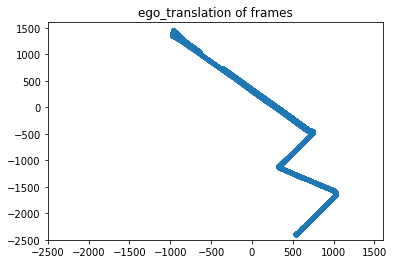

In [13]:
frames = zarr_dataset.frames

## This is slow.
# coords = np.zeros((len(frames), 2))
# for idx_coord, idx_data in enumerate(tqdm(range(len(frames)), desc="getting centroid to plot trajectory")):
#     frame = zarr_dataset.frames[idx_data]
#     coords[idx_coord] = frame["ego_translation"][:2]

# This is much faster!
coords = frames["ego_translation"][:, :2]

plt.scatter(coords[:, 0], coords[:, 1], marker='.')
axes = plt.gca()
axes.set_xlim([-2500, 1600])
axes.set_ylim([-2500, 1600])
plt.title("ego_translation of frames")

[Note] Performance-aware slicing

I commented out some codes which uses for loop. This is slow because when we call `zarr_dataset.frames[idx_data]`, **data is decompressed everytime** using zarr format.<br/>
Instead, we can remove for loop by using slice accessing. `frames["ego_translation"]` is same as `frames[:]["ego_translation"]`, which accesses all the element's "ego_translation" field. By writing this, number of decompression call is reduced and code runs faster dramatically.

## pytorch Dataset class

Instead of working with raw data, L5Kit provides PyTorch ready datasets.
It's much easier to use this wrapped dataset class to access data.

2 dataset class is implemented.

 - **EgoDataset**: this dataset iterates over the AV (Autonomous Vehicle) annotations
 - **AgentDataset**: this dataset iterates over other agents annotations

In [14]:
# 'map_type': 'py_semantic' for cfg.
semantic_rasterizer = build_rasterizer(cfg, dm)
semantic_dataset = EgoDataset(cfg, zarr_dataset, semantic_rasterizer)

Rasterizer is in charge of visualizing the data, as we will see next.

## Visualization example

Lyft l5kit also provides visualization functionalities.<br/>
We will visualize data to understand what kind of information is stored in this dataset.<br/>

We can sample a data from dataset, and convert to RGB image using `rasterizer`.

 - image: (channel, height, width) image of a frame. This is Birds-eye-view (BEV) representation.
 - target_positions: (n_frames, 2) displacements in meters in world coordinates
 - target_yaws: (n_frames, 1)
 - centroid: (2) center position x&y.
 - world_to_image: (3, 3) 3x3 matrix, used for transform matrix.

Data is represented as 2.5D, positions and yaws are separated.<br/>
target_positions are represented in world coordinates and it is converted to pixel coordinates to visualize below:

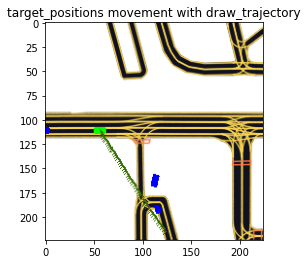

In [15]:
from IPython.display import display, clear_output
import PIL

def visualize_trajectory(dataset, index, title="target_positions movement with draw_trajectory"):
    data = dataset[index]
    im = data["image"].transpose(1, 2, 0)
    im = dataset.rasterizer.to_rgb(im)
    target_positions_pixels = transform_points(data["target_positions"] + data["centroid"][:2], data["world_to_image"])
    center_in_pixels = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    draw_trajectory(im, target_positions_pixels, center_in_pixels, TARGET_POINTS_COLOR, data["target_yaws"])
    clear_output(wait=True)

    plt.title(title)
    plt.imshow(im[::-1])
    plt.show()

visualize_trajectory(semantic_dataset, index=0)

We can switch rasterizer to visualize satellite image easily!

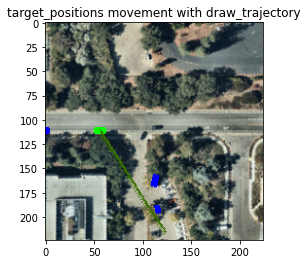

In [16]:
# map_type was changed from 'py_semantic' to 'py_satellite'.
cfg["raster_params"]["map_type"] = "py_satellite"
satellite_rasterizer = build_rasterizer(cfg, dm)
satellite_dataset = EgoDataset(cfg, zarr_dataset, satellite_rasterizer)

visualize_trajectory(satellite_dataset, index=0)

In [17]:
type(satellite_rasterizer), type(semantic_rasterizer)

(l5kit.rasterization.sat_box_rasterizer.SatBoxRasterizer,
 l5kit.rasterization.sem_box_rasterizer.SemBoxRasterizer)

Now we visualized **EgoDataset**.

**AgentDataset** can be used to visualize an agent. This dataset iterates over agents and not the AV anymore, and the first one happens to be the pace car (you will see this one around a lot in the dataset).

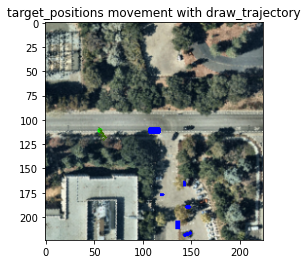

In [18]:
agent_dataset = AgentDataset(cfg, zarr_dataset, satellite_rasterizer)
visualize_trajectory(agent_dataset, index=0)

You can compare above 2 images, only the target car changed from host to agent.

<blockquote> <b>System Origin and Orientation</b>

At this point you may have noticed that we flip the image on the Y-axis before plotting it.

When moving from 3D to 2D we stick to a right-hand system, where the origin is in the bottom-left corner with positive x-values going right and positive y-values going up the image plane. The camera is facing down the negative z axis.

However, both opencv and pyplot place the origin in the top-left corner with positive x going right and positive y going down in the image plane. The camera is facing down the positive z-axis.

The flip done on the resulting image is for visualisation purposes to accommodate the difference in the two coordinate frames.

Further, all our rotations are counter-clockwise for positive value of the angle.
</blockquote>


## Scene handling

Both EgoDataset and AgentDataset provide 2 methods for getting interesting indices:

 - **get_frame_indices** returns the indices for a given frame. For the `EgoDataset` this matches a single observation, while more than one index could be available for the `AgentDataset`, as that given frame may contain more than one valid agent
 - **get_scene_indices** returns indices for a given scene. For both datasets, these might return more than one index

In [19]:
from IPython.display import display, clear_output
import PIL
 
dataset = semantic_dataset
scene_idx = 34
indexes = dataset.get_scene_indices(scene_idx)
images = []

for idx in indexes:
    data = dataset[idx]
    im = data["image"].transpose(1, 2, 0)
    im = dataset.rasterizer.to_rgb(im)
    target_positions_pixels = transform_points(data["target_positions"] + data["centroid"][:2], data["world_to_image"])
    center_in_pixels = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    draw_trajectory(im, target_positions_pixels, center_in_pixels, TARGET_POINTS_COLOR, data["target_yaws"])
    clear_output(wait=True)
    images.append(PIL.Image.fromarray(im[::-1]))

In [20]:
%%capture
# From https://www.kaggle.com/jpbremer/lyft-scene-visualisations by @jpbremer
def animate_solution(images):

    def animate(i):
        im.set_data(images[i])
        return (im,)
 
    fig, ax = plt.subplots()
    im = ax.imshow(images[0])
    def init():
        im.set_data(images[0])
        return (im,)
    
    return animation.FuncAnimation(fig, animate, init_func=init, frames=len(images), interval=60, blit=True)

anim = animate_solution(images)

In [21]:
HTML(anim.to_jshtml())

# Metadata Exploration

Now that we can explore the images, we can also get a little down and dirty when it comes to the ZARR files. It's rather simple to use with the Python library for exploring them, especially the fact that it's NumPy interoperable.

In [22]:
import zarr

train = zarr.open("../input/lyft-motion-prediction-autonomous-vehicles/scenes/train.zarr")
validation = zarr.open("../input/lyft-motion-prediction-autonomous-vehicles/scenes/validate.zarr")
test = zarr.open("../input/lyft-motion-prediction-autonomous-vehicles/scenes/test.zarr/")
train.info

Name,/
Type,zarr.hierarchy.Group
Read-only,False
Store type,zarr.storage.DirectoryStore
No. members,5
No. arrays,4
No. groups,1
Arrays,"agents, frames, scenes, traffic_light_faces"
Groups,agents_mask


We can see that our train.zarr file has set of 4 arrays. All this 4 fields are described above in the Data Format section above. Let us check these fields. We will check 1 observation from each.

In [23]:
print(f'We have {len(train.agents)} agents, {len(train.scenes)} scenes, {len(train.frames)} frames and {len(train.traffic_light_faces)} traffic light faces in train.zarr.')
print(f'We have {len(validation.agents)} agents, {len(validation.scenes)} scenes, {len(validation.frames)} frames and {len(validation.traffic_light_faces)} traffic light faces in validation.zarr.')
print(f'We have {len(test.agents)} agents, {len(test.scenes)} scenes, {len(test.frames)} frames and {len(test.traffic_light_faces)} traffic light faces in test.zarr.')

We have 320124624 agents, 16265 scenes, 4039527 frames and 38735988 traffic light faces in train.zarr.
We have 312617887 agents, 16220 scenes, 4030296 frames and 29277930 traffic light faces in validation.zarr.
We have 88594921 agents, 11314 scenes, 1131400 frames and 7854144 traffic light faces in test.zarr.


The data is expected to live in a folder that can be configured using the L5KIT_DATA_FOLDER env variable. We will now develop some intuition about the data.

In [24]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = "../input/lyft-motion-prediction-autonomous-vehicles"

# get configuration yaml
cfg = load_config_data("../input/lyft-config-files/visualisation_config.yaml")
print(cfg)

{'format_version': 4, 'model_params': {'model_architecture': 'resnet50', 'history_num_frames': 0, 'history_step_size': 1, 'history_delta_time': 0.1, 'future_num_frames': 50, 'future_step_size': 1, 'future_delta_time': 0.1}, 'raster_params': {'raster_size': [224, 224], 'pixel_size': [0.5, 0.5], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5}, 'val_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 12, 'shuffle': False, 'num_workers': 16}}


We will look at this yaml file from an external dataset(provided in L5kit examples). Let's look the raster_params filed. It contains information related to the transformation of the 3D world onto image plane. You can also check for various other information.

In [25]:
# Raster Parameters
print(f'current raster_param:\n')
for k,v in cfg["raster_params"].items():
    print(f"{k}:{v}")

current raster_param:

raster_size:[224, 224]
pixel_size:[0.5, 0.5]
ego_center:[0.25, 0.5]
map_type:py_semantic
satellite_map_key:aerial_map/aerial_map.png
semantic_map_key:semantic_map/semantic_map.pb
dataset_meta_key:meta.json
filter_agents_threshold:0.5


We're building a LocalDataManager object. This will resolve relative paths from the config using the L5KIT_DATA_FOLDER env variable we have just set. We will work with sample.zarr for developing intuition regarding the data. Please use train.zarr, validate.zarr and test.zarr for actual model training, validation and prediction.

In [26]:
dm = LocalDataManager()
dataset_path = dm.require(cfg["val_data_loader"]["key"]);rasterizer = build_rasterizer(cfg, dm)
zarr_dataset = ChunkedDataset(dataset_path)
train_dataset_a = AgentDataset(cfg, zarr_dataset, rasterizer)
zarr_dataset.open()
print(zarr_dataset)

print(dataset_path)

+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   24838    |  1893736   |     316008    |       0.69      |        248.38        |        76.24         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
../input/lyft-motion-prediction-autonomous-vehicles/scenes/sample.zarr


## Agents

An agent is an observation by the AV of some other detected object. Each entry describes the object in terms of its attributes such as position and velocity, gives the agent a tracking number to track it over multiple frames (but only within the same scene!) and its most probable label.

In [28]:
agents = pd.DataFrame.from_records(zarr_dataset.agents, columns = ['centroid', 'extent', 'yaw', 'velocity', 'track_id', 'label_probabilities'])
agents.head()

,centroid,extent,yaw,velocity,track_id,label_probabilities
0,"[665.0342407226562, -2207.51220703125]","[4.3913283, 1.8138304, 1.5909758]",1.016675,"[0.0, 0.0]",1,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,"[717.6612548828125, -2173.760009765625]","[5.150925, 1.9530917, 2.04021]",-0.783224,"[0.0, 0.0]",2,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,"[730.681396484375, -2180.678955078125]","[2.9482825, 1.4842174, 1.1125067]",-0.321747,"[0.0, 0.0]",3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,"[671.2536010742188, -2204.745361328125]","[1.7067024, 0.9287868, 0.6282158]",0.785501,"[0.0, 0.0]",4,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,"[669.7763061523438, -2213.004638671875]","[0.25109944, 0.6343781, 1.654377]",1.492359,"[0.0, 0.0]",5,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


Points to note :

* centroid - position of agent
* extent - agent dimension
* yaw - rotation of an agent with respect to vertical axis. A yaw rotation is a movement around the yaw axis of a rigid body that changes the direction it is pointing, to the left or right of its direction of motion.
* velocity - speed of the agent
* track_id - unique id to track agent in different frames
* label_probabilities - prabability an agent belong to one of the 17 classes. (We are only given three labels [cyclist, pedestrians and cars])

### Centroid Distribution

We will see the distribution of centroid now. Since centroid column consist of list per sample we will make two new columns centroid_x and centroid_y.

In [29]:
agents[['centroid_x','centroid_y']] = agents['centroid'].to_list()
agents = agents.drop('centroid', axis=1)
agents_new = agents[["centroid_x", "centroid_y", "extent", "yaw", "velocity", "track_id", "label_probabilities"]]
del agents
agents_new

,centroid_x,centroid_y,extent,yaw,velocity,track_id,label_probabilities
0,665.034241,-2207.512207,"[4.3913283, 1.8138304, 1.5909758]",1.016675,"[0.0, 0.0]",1,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,717.661255,-2173.760010,"[5.150925, 1.9530917, 2.04021]",-0.783224,"[0.0, 0.0]",2,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,730.681396,-2180.678955,"[2.9482825, 1.4842174, 1.1125067]",-0.321747,"[0.0, 0.0]",3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,671.253601,-2204.745361,"[1.7067024, 0.9287868, 0.6282158]",0.785501,"[0.0, 0.0]",4,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,669.776306,-2213.004639,"[0.25109944, 0.6343781, 1.654377]",1.492359,"[0.0, 0.0]",5,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...
1893731,278.237427,50.953831,"[2.651326, 16.242971, 1.8459053]",0.728024,"[0.0, 0.0]",1478,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893732,321.081635,35.298061,"[0.34564313, 0.7559242, 0.5863746]",0.582523,"[0.09659984, -0.23340665]",1479,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893733,227.163437,73.988060,"[2.024245, 0.3544109, 0.8435698]",0.942606,"[-0.091657355, 3.9186544]",1481,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893734,213.863144,75.332466,"[0.51277804, 1.2809446, 1.1334285]",-0.809572,"[0.0, 0.0]",1483,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


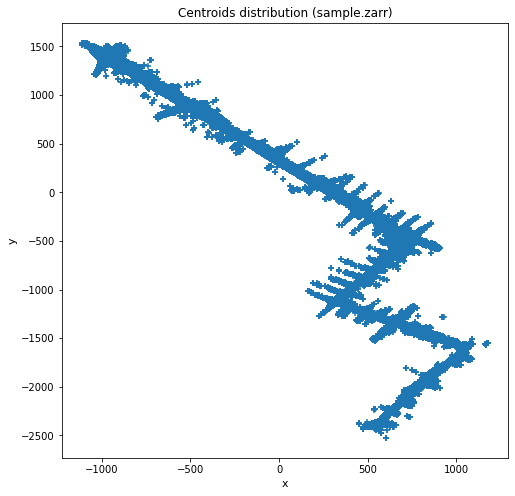

In [30]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
plt.scatter(agents_new['centroid_x'], agents_new['centroid_y'], marker='+')
plt.xlabel('x', fontsize=11); plt.ylabel('y', fontsize=11)
plt.title("Centroids distribution (sample.zarr)")
plt.show()

### Extent Distribution

First we need to make new columns for extent_x, extent_y and extent_z as we have one extent column.

In [31]:
agents_new[['extent_x','extent_y', 'extent_z']] = agents_new['extent'].to_list()
agents_new = agents_new.drop('extent', axis=1)
agents = agents_new[["centroid_x", "centroid_y", 'extent_x', 'extent_y', 'extent_z', "yaw", "velocity", "track_id", "label_probabilities"]]
del agents_new
agents

,centroid_x,centroid_y,extent_x,extent_y,extent_z,yaw,velocity,track_id,label_probabilities
0,665.034241,-2207.512207,4.391328,1.813830,1.590976,1.016675,"[0.0, 0.0]",1,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,717.661255,-2173.760010,5.150925,1.953092,2.040210,-0.783224,"[0.0, 0.0]",2,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,730.681396,-2180.678955,2.948282,1.484217,1.112507,-0.321747,"[0.0, 0.0]",3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,671.253601,-2204.745361,1.706702,0.928787,0.628216,0.785501,"[0.0, 0.0]",4,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,669.776306,-2213.004639,0.251099,0.634378,1.654377,1.492359,"[0.0, 0.0]",5,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...
1893731,278.237427,50.953831,2.651326,16.242971,1.845905,0.728024,"[0.0, 0.0]",1478,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893732,321.081635,35.298061,0.345643,0.755924,0.586375,0.582523,"[0.09659984, -0.23340665]",1479,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893733,227.163437,73.988060,2.024245,0.354411,0.843570,0.942606,"[-0.091657355, 3.9186544]",1481,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893734,213.863144,75.332466,0.512778,1.280945,1.133428,-0.809572,"[0.0, 0.0]",1483,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


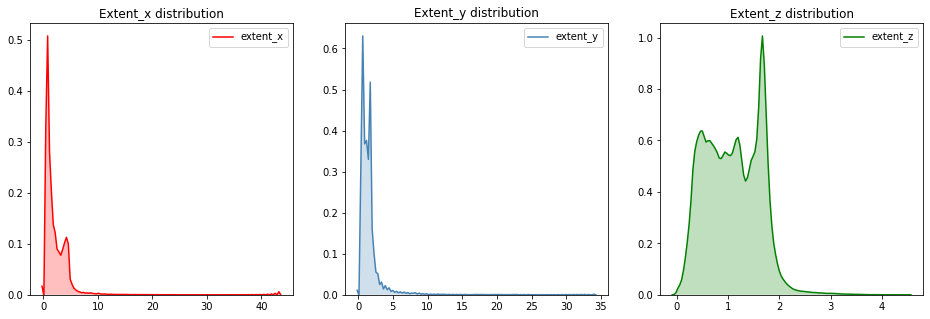

In [32]:
sns.axes_style("white")

fig, ax = plt.subplots(1,3,figsize=(16,5))

plt.subplot(1,3,1)
sns.kdeplot(agents['extent_x'], shade=True, color='red');
plt.title("Extent_x distribution")

plt.subplot(1,3,2)
sns.kdeplot(agents['extent_y'], shade=True, color='steelblue');
plt.title("Extent_y distribution")

plt.subplot(1,3,3)
sns.kdeplot(agents['extent_z'], shade=True, color='green');
plt.title("Extent_z distribution")

plt.show();

Points to note :

* We can see extent distributions are right skewed.
* We can see long tails in positive direction.

### Extent Distribution: Scatterplot

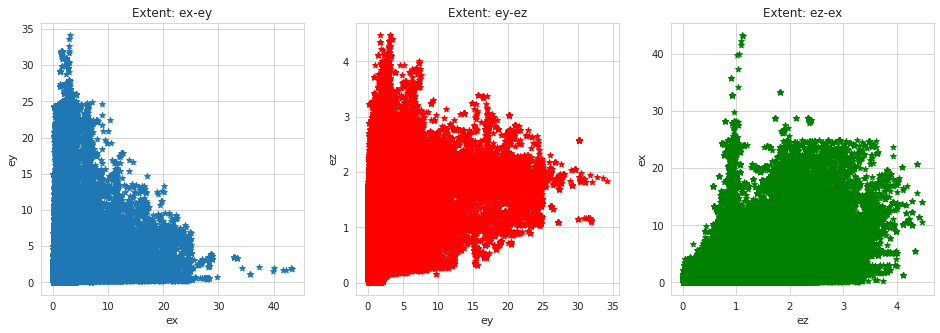

In [33]:
sns.set_style('whitegrid')

fig, ax = plt.subplots(1,3,figsize=(16,5))
plt.subplot(1,3,1)
plt.scatter(agents['extent_x'], agents['extent_y'], marker='*')
plt.xlabel('ex', fontsize=11); plt.ylabel('ey', fontsize=11)
plt.title("Extent: ex-ey")

plt.subplot(1,3,2)
plt.scatter(agents['extent_y'], agents['extent_z'], marker='*', color="red")
plt.xlabel('ey', fontsize=11); plt.ylabel('ez', fontsize=11)
plt.title("Extent: ey-ez")

plt.subplot(1,3,3)
plt.scatter(agents['extent_z'], agents['extent_x'], marker='*', color="green")
plt.xlabel('ez', fontsize=11); plt.ylabel('ex', fontsize=11)
plt.title("Extent: ez-ex")

plt.show();

### Yaw Distribution

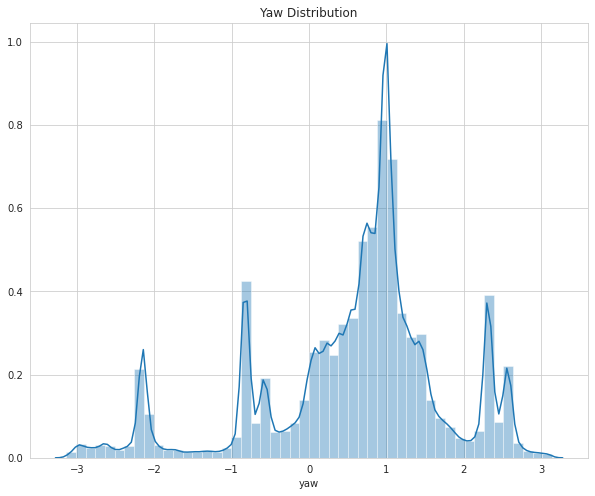

In [34]:
fig, ax = plt.subplots(1,1,figsize=(10,8))
sns.distplot(agents['yaw'])
plt.title("Yaw Distribution")
plt.show()

### Velocity Distribution

In [35]:
agents[['velocity_x','velocity_y']] = agents['velocity'].to_list()
agents_vel = agents.drop('velocity', axis=1)
agents_v = agents_vel[["centroid_x", "centroid_y", 'extent_x', 'extent_y', 'extent_z', "yaw", "velocity_x", "velocity_y", "track_id", "label_probabilities"]]
del agents
agents_v

,centroid_x,centroid_y,extent_x,extent_y,extent_z,yaw,velocity_x,velocity_y,track_id,label_probabilities
0,665.034241,-2207.512207,4.391328,1.813830,1.590976,1.016675,0.000000,0.000000,1,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,717.661255,-2173.760010,5.150925,1.953092,2.040210,-0.783224,0.000000,0.000000,2,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,730.681396,-2180.678955,2.948282,1.484217,1.112507,-0.321747,0.000000,0.000000,3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,671.253601,-2204.745361,1.706702,0.928787,0.628216,0.785501,0.000000,0.000000,4,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,669.776306,-2213.004639,0.251099,0.634378,1.654377,1.492359,0.000000,0.000000,5,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...,...
1893731,278.237427,50.953831,2.651326,16.242971,1.845905,0.728024,0.000000,0.000000,1478,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893732,321.081635,35.298061,0.345643,0.755924,0.586375,0.582523,0.096600,-0.233407,1479,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893733,227.163437,73.988060,2.024245,0.354411,0.843570,0.942606,-0.091657,3.918654,1481,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1893734,213.863144,75.332466,0.512778,1.280945,1.133428,-0.809572,0.000000,0.000000,1483,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


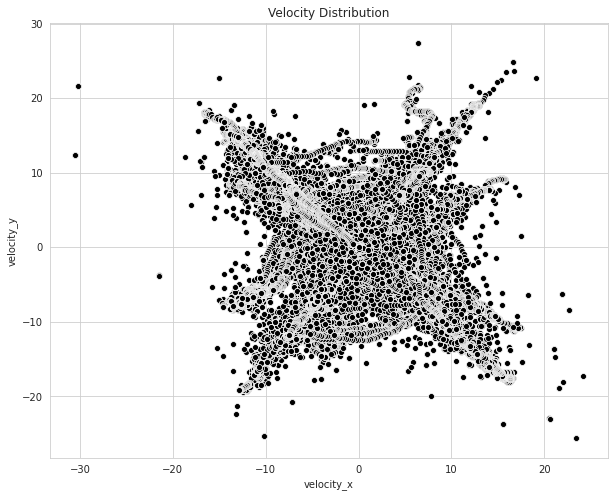

In [36]:
fig, ax = plt.subplots(1,1,figsize=(10,8))

with sns.axes_style("whitegrid"):
    sns.scatterplot(x=agents_v["velocity_x"], y=agents_v["velocity_y"], color='k');
    plt.title('Velocity Distribution')

In [37]:
agents = zarr_dataset.agents
probabilities = agents["label_probabilities"]
labels_indexes = np.argmax(probabilities, axis=1)
counts = []
for idx_label, label in enumerate(PERCEPTION_LABELS):
    counts.append(np.sum(labels_indexes == idx_label))
    
table = PrettyTable(field_names=["label", "counts"])
for count, label in zip(counts, PERCEPTION_LABELS):
    table.add_row([label, count])
print(table)

+------------------------------------+---------+
|               label                |  counts |
+------------------------------------+---------+
|      PERCEPTION_LABEL_NOT_SET      |    0    |
|      PERCEPTION_LABEL_UNKNOWN      | 1324481 |
|     PERCEPTION_LABEL_DONTCARE      |    0    |
|        PERCEPTION_LABEL_CAR        |  519385 |
|        PERCEPTION_LABEL_VAN        |    0    |
|       PERCEPTION_LABEL_TRAM        |    0    |
|        PERCEPTION_LABEL_BUS        |    0    |
|       PERCEPTION_LABEL_TRUCK       |    0    |
| PERCEPTION_LABEL_EMERGENCY_VEHICLE |    0    |
|   PERCEPTION_LABEL_OTHER_VEHICLE   |    0    |
|      PERCEPTION_LABEL_BICYCLE      |    0    |
|    PERCEPTION_LABEL_MOTORCYCLE     |    0    |
|      PERCEPTION_LABEL_CYCLIST      |   6688  |
|   PERCEPTION_LABEL_MOTORCYCLIST    |    0    |
|    PERCEPTION_LABEL_PEDESTRIAN     |  43182  |
|      PERCEPTION_LABEL_ANIMAL       |    0    |
|     AVRESEARCH_LABEL_DONTCARE      |    0    |
+-------------------

As we can see indeed there are only four types of agents provided in the dataset such as Cars, Cyclists, Pedestrians and Unknown. We can see that Unknown label is more as compared to other three agent labels.

In [39]:
from colorama import Fore, Back, Style
print(f'{Fore.YELLOW}Total number of agents in sample .zarr files is {Style.RESET_ALL}{len(zarr_dataset.agents)}. {Fore.BLUE}\nAfter summing up the elements in count column we can see we have {Style.RESET_ALL}{(1324481 + 519385 + 6688 + 43182)} {Fore.BLUE}agents in total.')

Total number of agents in sample .zarr files is 1893736. 
After summing up the elements in count column we can see we have 1893736 agents in total.


## Scenes

A scene is identified by the host (i.e. which car was used to collect it) and a start and end time. It consists of multiple frames (=snapshots at discretized time intervals). The scene datatype stores references to its corresponding frames in terms of the start and end index within the frames array (described in dataframe below). The frames in between these indices all correspond to the scene (including start index, excluding end index).

In [40]:
scenes = pd.DataFrame.from_records(zarr_dataset.scenes, columns = ['frame_index_interval', 'host', 'start_time', 'end_time'])
scenes.head()

,frame_index_interval,host,start_time,end_time
0,"[0, 248]",host-a013,1572643684617362176,1572643709617362176
1,"[248, 497]",host-a013,1572643749559148288,1572643774559148288
2,"[497, 746]",host-a013,1572643774559148288,1572643799559148288
3,"[746, 995]",host-a013,1572643799559148288,1572643824559148288
4,"[995, 1244]",host-a013,1572643824559148288,1572643849559148288


Points to note :

* frame_index_interval - frame index (including start index, excluding end index)
* host - car used to collect data
* start_time - start time of scene
* end_time - end time of scene

### Frame Index

In [41]:
scenes[['frame_start_index','frame_end_index']] = scenes['frame_index_interval'].to_list()
scenes_new = scenes.drop('frame_index_interval', axis=1)
scenes_new = scenes_new[["frame_start_index", "frame_end_index", 'host', 'start_time', 'end_time']]
del scenes
scenes_new.head()

,frame_start_index,frame_end_index,host,start_time,end_time
0,0,248,host-a013,1572643684617362176,1572643709617362176
1,248,497,host-a013,1572643749559148288,1572643774559148288
2,497,746,host-a013,1572643774559148288,1572643799559148288
3,746,995,host-a013,1572643799559148288,1572643824559148288
4,995,1244,host-a013,1572643824559148288,1572643849559148288


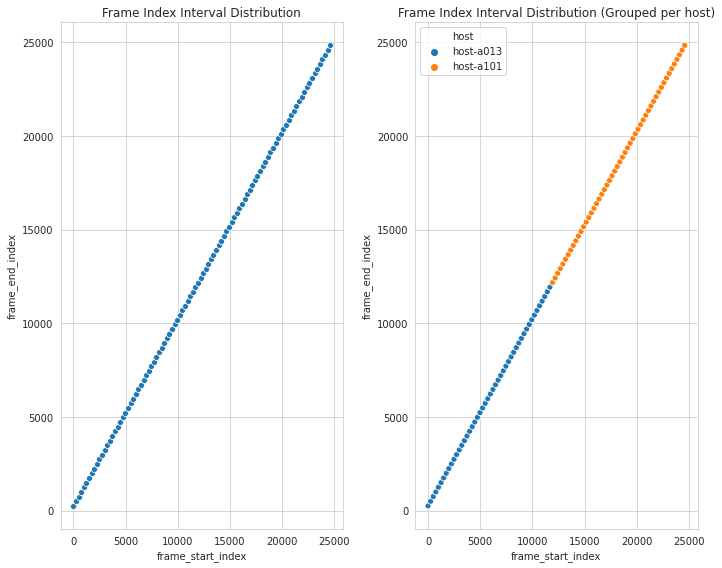

In [42]:
f = plt.figure(figsize=(10, 8))
gs = f.add_gridspec(1, 2)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0,0])
    sns.scatterplot(scenes_new['frame_start_index'], scenes_new['frame_end_index'])
    plt.title('Frame Index Interval Distribution')
    
with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0,1])
    sns.scatterplot(scenes_new['frame_start_index'], scenes_new['frame_end_index'], hue=scenes_new['host'])
    plt.title('Frame Index Interval Distribution (Grouped per host)')
    
f.tight_layout()

 Points to note :

* We can see linear trend here.
* Both host cars collected data within particular time intervals.

### Host Count

We will now see the host counts (Ego vehicle used to collect the data).

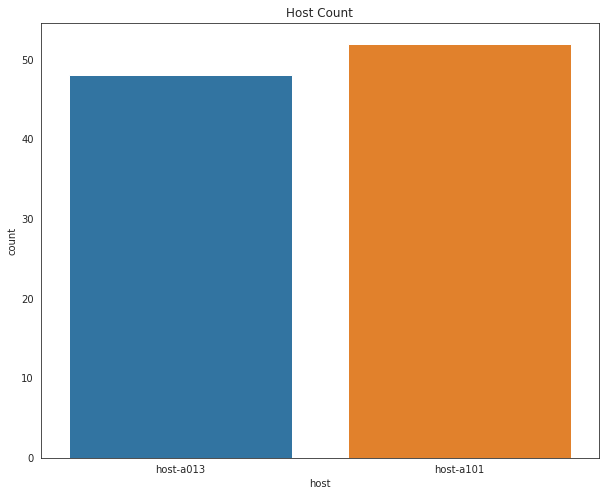

In [43]:
f = plt.figure(figsize=(10, 8))

with sns.axes_style("white"):
    sns.countplot(scenes_new['host']);
    plt.title("Host Count")

Points to note :

* We have two host cars which were used to collect the data "host-a013" and "host-a101".

## Frames

A frame captures all information that was observed at a time. This includes the following fields as mentioned in dataframe below.

In [44]:
frames = pd.DataFrame.from_records(zarr_dataset.frames, columns = ['timestamp', 'agent_index_interval', 'traffic_light_faces_index_interval', 'ego_translation','ego_rotation'])
frames.head()

,timestamp,agent_index_interval,traffic_light_faces_index_interval,ego_translation,ego_rotation
0,1572643684801892606,"[0, 38]","[0, 0]","[680.6197509765625, -2183.32763671875, 288.541...","[[0.5467331409454346, -0.837294340133667, 0.00..."
1,1572643684901714926,"[38, 85]","[0, 0]","[681.1856079101562, -2182.42236328125, 288.608...","[[0.5470812916755676, -0.837059736251831, 0.00..."
2,1572643685001499246,"[85, 142]","[0, 0]","[681.7647094726562, -2181.522705078125, 288.68...","[[0.5479603409767151, -0.8364874720573425, 0.0..."
3,1572643685101394026,"[142, 200]","[0, 0]","[682.3414306640625, -2180.624267578125, 288.75...","[[0.5491225123405457, -0.8357341885566711, 0.0..."
4,1572643685201412346,"[200, 254]","[0, 0]","[682.9197998046875, -2179.73046875, 288.827392...","[[0.5504215955734253, -0.8348868489265442, -7...."


Points to note :

* timestamp - frame's timestamp
* agent_index_interval - agents (vehicles, cyclists and pedestrians) that were captured by the ego's sensors
* traffic_light_faces_index_interval - traffic light index
* ego_translation - position of host car.
* ego_rotation - rotation of host car (which is collecting data using ego sensors)

### Ego Translation Distribution

In [45]:
frames[['ego_translation_x', 'ego_translation_y', 'ego_translation_z']] = frames['ego_translation'].to_list()
frames_new = frames.drop('ego_translation', axis=1)
frames_new = frames_new[['timestamp', 'agent_index_interval', 'traffic_light_faces_index_interval',
                         'ego_translation_x', 'ego_translation_y', 'ego_translation_z', 'ego_rotation']]
del frames
frames_new.head()

,timestamp,agent_index_interval,traffic_light_faces_index_interval,ego_translation_x,ego_translation_y,ego_translation_z,ego_rotation
0,1572643684801892606,"[0, 38]","[0, 0]",680.619751,-2183.327637,288.541138,"[[0.5467331409454346, -0.837294340133667, 0.00..."
1,1572643684901714926,"[38, 85]","[0, 0]",681.185608,-2182.422363,288.608124,"[[0.5470812916755676, -0.837059736251831, 0.00..."
2,1572643685001499246,"[85, 142]","[0, 0]",681.764709,-2181.522705,288.680939,"[[0.5479603409767151, -0.8364874720573425, 0.0..."
3,1572643685101394026,"[142, 200]","[0, 0]",682.341431,-2180.624268,288.755920,"[[0.5491225123405457, -0.8357341885566711, 0.0..."
4,1572643685201412346,"[200, 254]","[0, 0]",682.919800,-2179.730469,288.827393,"[[0.5504215955734253, -0.8348868489265442, -7...."


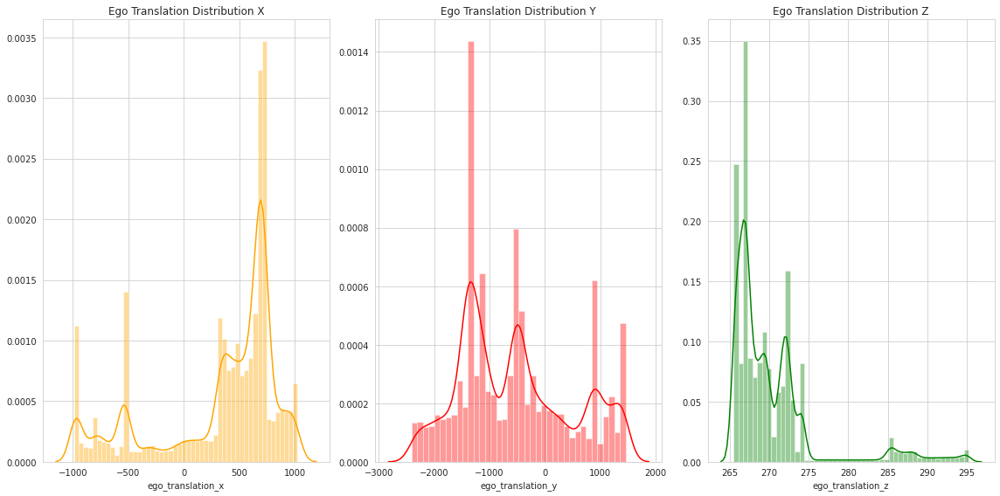

In [46]:
f = plt.figure(figsize=(16, 8))
gs = f.add_gridspec(1, 3)

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0,0])
    sns.distplot(frames_new['ego_translation_x'], color='Orange')
    plt.title('Ego Translation Distribution X')
    
with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0,1])
    sns.distplot(frames_new['ego_translation_y'], color='Red')
    plt.title('Ego Translation Distribution Y')
    
with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[0,2])
    sns.distplot(frames_new['ego_translation_z'], color='Green')
    plt.title('Ego Translation Distribution Z')
    
f.tight_layout()

Points to note :

* We can see the distributions are multi-models here.

### Ego Translation Scatterplot

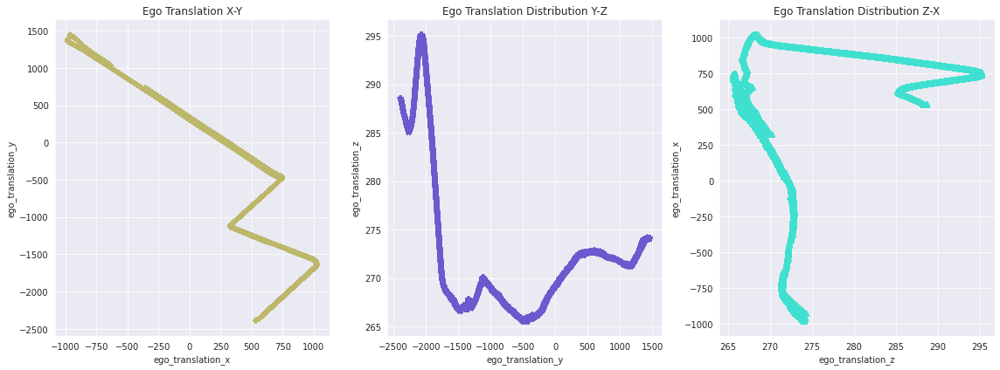

In [47]:
f = plt.figure(figsize=(16, 6))
gs = f.add_gridspec(1, 3)

with sns.axes_style("darkgrid"):
    ax = f.add_subplot(gs[0,0])
    plt.scatter(frames_new['ego_translation_x'], frames_new['ego_translation_y'],
                    color='darkkhaki', marker='+')
    plt.title('Ego Translation X-Y')
    plt.xlabel('ego_translation_x')
    plt.ylabel('ego_translation_y')
    
with sns.axes_style("darkgrid"):
    ax = f.add_subplot(gs[0,1])
    plt.scatter(frames_new['ego_translation_y'], frames_new['ego_translation_z'],
                    color='slateblue', marker='*')
    plt.title('Ego Translation Distribution Y-Z')
    plt.xlabel('ego_translation_y')
    plt.ylabel('ego_translation_z')
    
with sns.axes_style("darkgrid"):
    ax = f.add_subplot(gs[0,2])
    plt.scatter(frames_new['ego_translation_z'], frames_new['ego_translation_x'],
                    color='turquoise', marker='^')
    plt.title('Ego Translation Distribution Z-X')
    plt.xlabel('ego_translation_z')
    plt.ylabel('ego_translation_x')
    
f.tight_layout()

### Ego Rotations Distribution

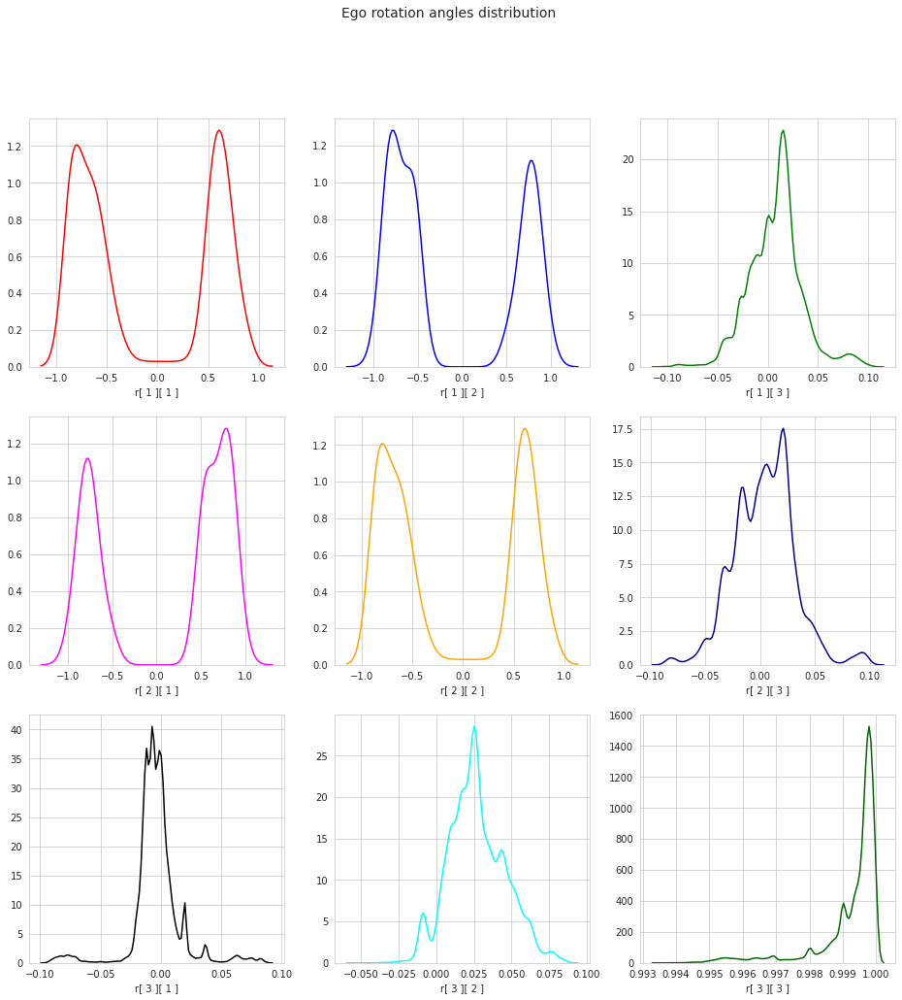

In [48]:
fig, ax = plt.subplots(3,3,figsize=(16,16))
colors = ['red', 'blue', 'green', 'magenta', 'orange', 'darkblue', 'black', 'cyan', 'darkgreen']
for i in range(0,3):
    for j in range(0,3):
        df = frames_new['ego_rotation'].apply(lambda x: x[i][j])
        plt.subplot(3,3,i * 3 + j + 1)
        sns.distplot(df, hist=False, color = colors[ i * 3 + j  ])
        plt.xlabel(f'r[ {i + 1} ][ {j + 1} ]')
fig.suptitle("Ego rotation angles distribution", size=14)
plt.show()

## Traffic Light Faces

The traffic light bulbs (red, green, yellow) are refered as face.

In [49]:
traffic_light_faces = pd.DataFrame.from_records(zarr_dataset.tl_faces, columns = ['face_id', 'traffic_light_id', 'traffic_light_face_status'])
traffic_light_faces.head()

,face_id,traffic_light_id,traffic_light_face_status
0,xbVG,/ggb,"[0.0, 0.0, 1.0]"
1,jutE,/ggb,"[0.0, 0.0, 1.0]"
2,CDDo,/ggb,"[0.0, 0.0, 1.0]"
3,xbVG,/ggb,"[0.0, 0.0, 1.0]"
4,jutE,/ggb,"[0.0, 0.0, 1.0]"


* face_id - unique id for traffic light bulb
* traffic_light_id - traffic light status
* traffic_light_face_status - out of red/green/yellow which face is active/unactive/unknown